In [0]:
import pandas as pd
import pyspark
from pyspark import SparkContext
from pyspark.sql import SparkSession

ss = SparkSession.builder.appName("BitcoinSentimentAnalysis").getOrCreate()

!wget https://proai-datasets.s3.eu-west-3.amazonaws.com/bitcoin_tweets.csv

dataset = pd.read_csv('bitcoin_tweets.csv', delimiter=",", low_memory=False)

df = ss.createDataFrame(dataset)
df = df.na.drop(how="all").dropna(subset=["text"])

df.write.format("parquet").mode("overwrite").saveAsTable("btc_tweets")
display(df)

--2024-06-30 08:40:18--  https://proai-datasets.s3.eu-west-3.amazonaws.com/bitcoin_tweets.csv
Resolving proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)... 52.95.156.52, 3.5.226.145
Connecting to proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)|52.95.156.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24708828 (24M) [text/csv]
Saving to: ‘bitcoin_tweets.csv.4’

bitcoin_tweets.csv. 100%[===================>]  23.56M  8.40MB/s    in 2.8s    

2024-06-30 08:40:22 (8.40 MB/s) - ‘bitcoin_tweets.csv.4’ saved [24708828/24708828]



id,user,fullname,url,timestamp,replies,likes,retweets,text
1.1329770553003008E18,KamdemAbdiel,Abdiel kamdem,null,2019-05-27 11:49:14+00,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS
1.13297707340273664E18,bitcointe,Bitcointe,null,2019-05-27 11:49:18+00,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency
1.13297702389313958E18,3eyedbran,Bran - 3 Eyed Raven,null,2019-05-27 11:49:06+00,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin
1.13297708908955635E18,DetroitCrypto,J. Scardina,null,2019-05-27 11:49:22+00,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USD ETH: $266.62 USD LTC: $114.03 USD BCH: $432.02 USD XLM: $0.133 USD DOGE: $ 0.00314 USD NEO: $12.04 USD XRP: $0.4092 USD CANN: $0.001482 USD EMC2: $0.1198 USD XMR: $94.65 USD BTG: $24.31 USD
1.13297709234019123E18,mmursaleen72,Muhammad Mursaleen,null,2019-05-27 11:49:23+00,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency. https://t.co/FJru1ooxSM https://t.co/fYBX4H6r6r https://t.co/xZSjmZ0h3K https://t.co/v7GRFIQG7w https://t.co/Oq5hQt5hNn
1.13297710030931955E18,0nurTOKA,🐻🔫💥🐂🚀🙏,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,"#btc inceldiği yerden kopsun bakalım 17:00 ye kadar bir hareket bekliyorum, yukarı yönlü olur umarın sanırım inşallah yani 😁 https://t.co/pIMyKfNtc8"
1.13297710163889766E18,evilrobotted,evilrobotted,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV. What have you been building on broken BTC?
1.1329771088363232E18,jabur_guilherme,Guilherme Jabur,null,2019-05-27 11:49:27+00,0.0,0.0,0.0,"@pedronauck como investidor, vc é um ótimo dev. Sorte q eu comprei os BTC, subiu a poha toda :o"
1.13297713185035059E18,INTBICON,億り人彼氏,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,ブラジルはまぁ置いといてもドイツは存在感出してくるのかな。ロシアもマイニングなどで元気になるかと思ったらそこまででしたね。 https://t.co/gcAh2HrlW6
1.13297713271456154E18,MLWright15,ML Wright,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end. The People Are Taking the Lead, & Leaders Will Have to Follow the Majority!!! WWG1WGQ!!! https://t.co/tAjFwxnWD4"


In [0]:
%sh pip install textblob

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 775.1/775.1 kB 18.1 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 24.1.1
[notice] To update, run: pip install --upgrade pip


In [0]:
from textblob import TextBlob
from pyspark.sql.functions import udf, when, col, to_date, year
from pyspark.sql.types import FloatType


def getSentiment(text):
    sentiment = TextBlob(text).sentiment.polarity
    if sentiment > 0:
        return 1.0
    elif sentiment < 0:
        return -1.0
    else:
        return 0.0

sentiment_score_udf = udf(lambda x: getSentiment(x), FloatType())

df = df.withColumn("sentiment", sentiment_score_udf(df["text"]))

df = df.withColumn("categories", when(df["sentiment"] == 1.0, "positive")
                               .when(df["sentiment"] == 0.0, "neutral")
                               .when(df["sentiment"] == -1.0, "negative"))

display(df)

id,user,fullname,url,timestamp,replies,likes,retweets,text,sentiment,categories
1.1329770553003008E18,KamdemAbdiel,Abdiel kamdem,null,2019-05-27 11:49:14+00,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS,0.0,neutral
1.13297707340273664E18,bitcointe,Bitcointe,null,2019-05-27 11:49:18+00,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency,0.0,neutral
1.13297702389313958E18,3eyedbran,Bran - 3 Eyed Raven,null,2019-05-27 11:49:06+00,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin,0.0,neutral
1.13297708908955635E18,DetroitCrypto,J. Scardina,null,2019-05-27 11:49:22+00,0.0,0.0,0.0,Current Crypto Prices! BTC: $8721.99 USD ETH: $266.62 USD LTC: $114.03 USD BCH: $432.02 USD XLM: $0.133 USD DOGE: $ 0.00314 USD NEO: $12.04 USD XRP: $0.4092 USD CANN: $0.001482 USD EMC2: $0.1198 USD XMR: $94.65 USD BTG: $24.31 USD,0.0,neutral
1.13297709234019123E18,mmursaleen72,Muhammad Mursaleen,null,2019-05-27 11:49:23+00,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency. https://t.co/FJru1ooxSM https://t.co/fYBX4H6r6r https://t.co/xZSjmZ0h3K https://t.co/v7GRFIQG7w https://t.co/Oq5hQt5hNn,0.0,neutral
1.13297710030931955E18,0nurTOKA,🐻🔫💥🐂🚀🙏,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,"#btc inceldiği yerden kopsun bakalım 17:00 ye kadar bir hareket bekliyorum, yukarı yönlü olur umarın sanırım inşallah yani 😁 https://t.co/pIMyKfNtc8",0.0,neutral
1.13297710163889766E18,evilrobotted,evilrobotted,null,2019-05-27 11:49:25+00,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV. What have you been building on broken BTC?,-1.0,negative
1.1329771088363232E18,jabur_guilherme,Guilherme Jabur,null,2019-05-27 11:49:27+00,0.0,0.0,0.0,"@pedronauck como investidor, vc é um ótimo dev. Sorte q eu comprei os BTC, subiu a poha toda :o",1.0,positive
1.13297713185035059E18,INTBICON,億り人彼氏,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,ブラジルはまぁ置いといてもドイツは存在感出してくるのかな。ロシアもマイニングなどで元気になるかと思ったらそこまででしたね。 https://t.co/gcAh2HrlW6,0.0,neutral
1.13297713271456154E18,MLWright15,ML Wright,null,2019-05-27 11:49:32+00,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end. The People Are Taking the Lead, & Leaders Will Have to Follow the Majority!!! WWG1WGQ!!! https://t.co/tAjFwxnWD4",1.0,positive


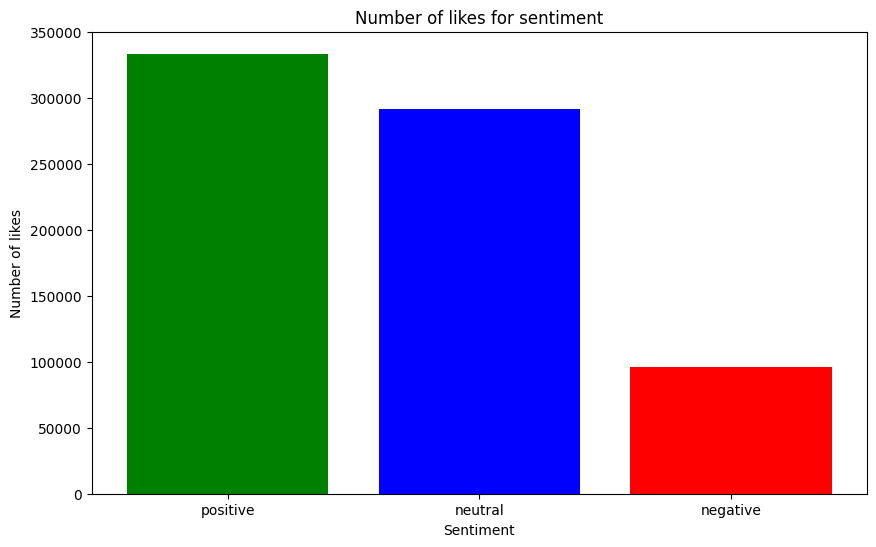

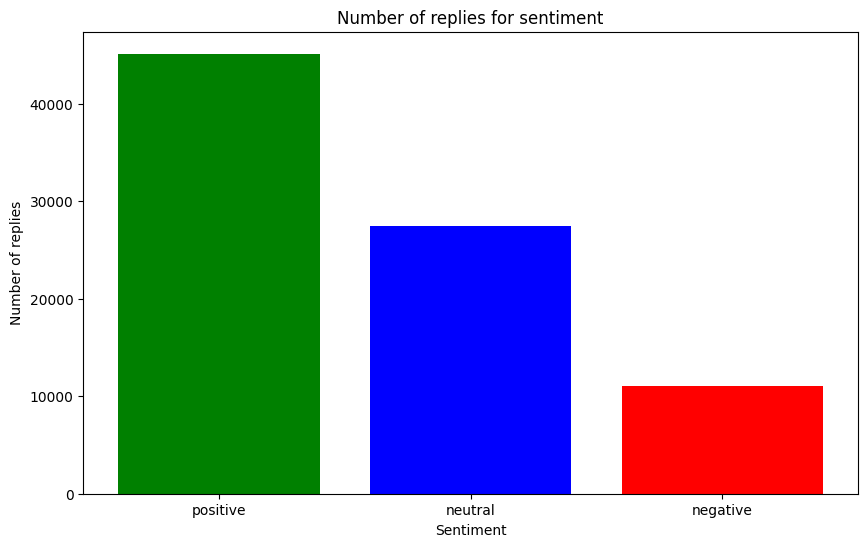

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt

df_likes = df.groupBy("categories").agg(F.sum("likes").alias("likes_sum"))
likes_data = df_likes.collect()


labels = [row['categories'] for row in likes_data]
sizes = [row['likes_sum'] for row in likes_data]
plt.figure(figsize=(10, 6))
plt.bar(labels, sizes, color=['green', 'blue', 'red'])
plt.xlabel("Sentiment")
plt.ylabel("Number of likes")
plt.title("Number of likes for sentiment")
plt.show()


df_replies = df.groupBy("categories").agg(F.sum("replies").alias("replies_sum"))
replies_data = df_replies.collect()


labels = [row['categories'] for row in replies_data]
sizes = [row['replies_sum'] for row in replies_data]
plt.figure(figsize=(10, 6))
plt.bar(labels, sizes, color=['green', 'blue', 'red'])
plt.xlabel("Sentiment")
plt.ylabel("Number of replies")
plt.title("Number of replies for sentiment")
plt.show()

The graph shows that negative tweets had neither more likes nor more replies than positive tweets.

**Change in sentiment over time**

In [0]:
df = df.withColumn("date", to_date(col("timestamp")))

df = df.withColumn("year", year(col("date")))

In [0]:
df_date_sentiment = df.groupBy("year", "categories").count()

df_date_sentiment.orderBy("year").show(50, truncate=False)

+----+----------+-----+
|year|categories|count|
+----+----------+-----+
|2009|neutral   |1    |
|2012|positive  |2    |
|2012|neutral   |1    |
|2013|positive  |1    |
|2013|neutral   |3    |
|2014|positive  |1    |
|2014|neutral   |4    |
|2015|positive  |2    |
|2015|neutral   |2    |
|2016|neutral   |21   |
|2016|negative  |1    |
|2016|positive  |5    |
|2017|positive  |32   |
|2017|neutral   |60   |
|2017|negative  |4    |
|2018|neutral   |924  |
|2018|negative  |93   |
|2018|positive  |527  |
|2019|negative  |9228 |
|2019|positive  |33450|
|2019|neutral   |55639|
+----+----------+-----+



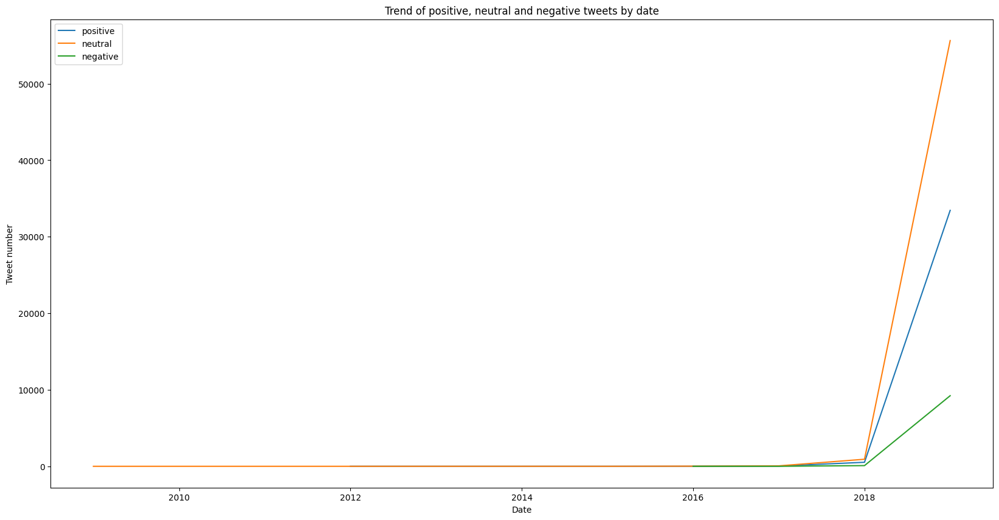

In [0]:

category_values = {}
for category in df_date_sentiment.select("categories").distinct().collect():
    category = category['categories']
    values = df_date_sentiment.filter(df_date_sentiment["categories"] == category).select("year", "count").orderBy("year").collect()
    category_values[category] = [(row["year"], row["count"]) for row in values]
    

plt.figure(figsize=(20, 10))
for category, values in category_values.items():
    x = [val[0] for val in values]
    y = [val[1] for val in values]
    plt.plot(x, y, label=category)


plt.xlabel("Date")
plt.ylabel("Tweet number")
plt.title("Trend of positive, neutral and negative tweets by date")
plt.legend()
plt.show()

The graph shows the change in the number of tweets over time, with an increase in particular in the years 2016-2019.

**Historical data of the btc usd**

In [0]:
%sh pip install yfinance


[notice] A new release of pip available: 22.3.1 -> 24.1.1
[notice] To update, run: pip install --upgrade pip


In [0]:
import yfinance as yf

btc_data = yf.download('BTC-USD', start='2010-01-01', end='2023-01-01', interval='1d')

btc_data.reset_index(inplace=True)

[*********************100%%**********************]  1 of 1 completed


In [0]:
btc_df = ss.createDataFrame(btc_data)

btc_df = btc_df.withColumn("date", to_date(col("Date")))

display(btc_df)

date,Open,High,Low,Close,Adj Close,Volume
2014-09-17,465.864013671875,468.17401123046875,452.4219970703125,457.3340148925781,457.3340148925781,21056800
2014-09-18,456.8599853515625,456.8599853515625,413.10400390625,424.44000244140625,424.44000244140625,34483200
2014-09-19,424.1029968261719,427.8349914550781,384.5320129394531,394.7959899902344,394.7959899902344,37919700
2014-09-20,394.6730041503906,423.2959899902344,389.88299560546875,408.90399169921875,408.90399169921875,36863600
2014-09-21,408.0849914550781,412.4259948730469,393.1809997558594,398.8210144042969,398.8210144042969,26580100
2014-09-22,399.1000061035156,406.9159851074219,397.1300048828125,402.1520080566406,402.1520080566406,24127600
2014-09-23,402.0920104980469,441.5570068359375,396.1969909667969,435.7909851074219,435.7909851074219,45099500
2014-09-24,435.7510070800781,436.11199951171875,421.1319885253906,423.2049865722656,423.2049865722656,30627700
2014-09-25,423.156005859375,423.5199890136719,409.4679870605469,411.5740051269531,411.5740051269531,26814400
2014-09-26,411.4289855957031,414.93798828125,400.0090026855469,404.42498779296875,404.42498779296875,21460800


**Analysis of the correlation between sentiment and change in the value of Bitcoin**

In [0]:
daily_sentiment = df.groupBy("date").agg(F.avg("sentiment").alias("avg_sentiment"))


combined_df = daily_sentiment.join(btc_df, on="date")

display(combined_df)

date,avg_sentiment,Open,High,Low,Close,Adj Close,Volume
2019-05-08,0.32222222222222224,5849.4814453125,5989.98095703125,5794.7158203125,5982.45751953125,5982.45751953125,15320605300
2019-05-27,0.2502168256721596,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,8805.7783203125,27949839564
2017-01-27,0.0,918.3590087890625,923.2230224609375,915.8460083007812,919.75,919.75,125594000
2019-03-17,0.6666666666666666,4047.719482421875,4054.1220703125,4006.4111328125,4025.22900390625,4025.22900390625,8221625400
2019-04-28,0.6666666666666666,5271.74658203125,5326.23193359375,5255.68359375,5285.13916015625,5285.13916015625,12819992056
2019-05-14,0.5714285714285714,7807.88427734375,8268.712890625,7696.39111328125,7994.416015625,7994.416015625,32031452227
2019-03-28,0.5714285714285714,4087.58447265625,4094.902099609375,4040.266357421875,4069.107177734375,4069.107177734375,9353915899
2019-05-10,0.24284894680763872,6175.82275390625,6434.61767578125,6161.51904296875,6378.84912109375,6378.84912109375,19419875368
2019-03-30,0.6666666666666666,4092.13623046875,4296.806640625,4053.90966796875,4106.66015625,4106.66015625,9732688060
2017-09-14,1.0,3875.3701171875,3920.60009765625,3153.860107421875,3154.949951171875,3154.949951171875,2716310016


In [0]:
combined_df = combined_df.withColumn("price_change", col("Close") - col("Open"))

correlation = combined_df.stat.corr("avg_sentiment", "price_change")
print(f"Correlation between the average daily sentiment and the change in the price of Bitcoin: {correlation}")

Correlation between the average daily sentiment and the change in the price of Bitcoin: 0.027162815406997536


The correlation coefficient obtained is **0.0272**, which indicates a very weak correlation between tweet sentiment and Bitcoin price change. 
This result suggests that the sentiment expressed in tweets is not a good indicator of daily Bitcoin price changes.